In [1]:
# Géomaticien - Test de Pré-sélection
# Data Innovation Lab

# Importer les bibliothèques nécessaires
import pandas as pd
import geopandas as gpd
import folium
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Section 1: Chargement des Données Géoréférencées
# -------------------------------------------------

In [58]:


# Charger les données depuis un fichier CSV
# Remarque: Actualiser les chemins d'accès
data_path = r"C:\Users\ADIE\Documents\stage_ansd\derniere_semaine\requete_ANSD.xlsx" 
df = pd.read_excel(data_path, decimal=".")

# Afficher un aperçu des données
df.head()

,id_dep,id_reg,Q1_1_5__Latitude,Q1_1_5__Longitude,Q1_3a_14,sup_ha
0,SALEMATA,KEDOUGOU,12.59,-12.81,Mais,0.65
1,MATAM,MATAM,15.48,-13.27,Mil,0.55
2,MATAM,MATAM,15.74,-13.39,Niébé,0.23
3,GOUDOMP,SEDHIOU,12.50,-15.72,Riz pluvial,0.11
4,GOUDOMP,SEDHIOU,12.77,-15.14,Mais,0.24


Traitement des données manquantes

In [59]:
# make value count to the column Longitude
df = df[~(df.Q1_1_5__Latitude==".a")]

# Uniquement suivant la latitude car les 2 manquent aux mêmes endroits simultanément

In [60]:
df.head()

,id_dep,id_reg,Q1_1_5__Latitude,Q1_1_5__Longitude,Q1_3a_14,sup_ha
0,SALEMATA,KEDOUGOU,12.59,-12.81,Mais,0.65
1,MATAM,MATAM,15.48,-13.27,Mil,0.55
2,MATAM,MATAM,15.74,-13.39,Niébé,0.23
3,GOUDOMP,SEDHIOU,12.50,-15.72,Riz pluvial,0.11
4,GOUDOMP,SEDHIOU,12.77,-15.14,Mais,0.24


In [61]:
# On transforme les coordonnées (latitude et longitude) en float

df.Q1_1_5__Latitude=df.Q1_1_5__Latitude.astype("float")
df.Q1_1_5__Longitude=df.Q1_1_5__Longitude.astype("float")

In [62]:
df.head()

,id_dep,id_reg,Q1_1_5__Latitude,Q1_1_5__Longitude,Q1_3a_14,sup_ha
0,SALEMATA,KEDOUGOU,12.59,-12.81,Mais,0.65
1,MATAM,MATAM,15.48,-13.27,Mil,0.55
2,MATAM,MATAM,15.74,-13.39,Niébé,0.23
3,GOUDOMP,SEDHIOU,12.50,-15.72,Riz pluvial,0.11
4,GOUDOMP,SEDHIOU,12.77,-15.14,Mais,0.24


In [8]:
print(df.shape)

(12679, 6)


# Section 2: Visualisation des Points sur une Carte
# -------------------------------------------------


In [63]:

# Convertir les colonnes longitude et latitude en objets géométriques
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Q1_1_5__Longitude, df.Q1_1_5__Latitude))

# Créer une carte centrée sur les données
m = folium.Map(location=[df.Q1_1_5__Latitude.mean(), df.Q1_1_5__Longitude.mean()], zoom_start=6)



In [10]:
# Ajouter les points à la carte
for _, row in gdf.iterrows():
    folium.CircleMarker(
        location=[row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude']],
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue'
    ).add_to(m)

# Afficher la carte
m

# Section 3: Visualisation Thématique
# -----------------------------------



In [12]:
# Créer une carte où la couleur des points reflète la superficie
m = folium.Map(location=[df.Q1_1_5__Latitude.mean(), df.Q1_1_5__Longitude.mean()], zoom_start=6)

# Choisir une palette de couleurs
colors = { 'small': 'green', 'medium': 'blue', 'large': 'red' }

# Ajouter des points avec des couleurs basées sur la superficie
for _, row in gdf.iterrows():
    size_category = 'small' if row['sup_ha']*1000 < 50 else 'medium' if row['sup_ha']*1000 < 200 else 'large'
    folium.CircleMarker(
        location=[row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude']],
        radius=5,
        color=colors[size_category],
        fill=True,
        fill_color=colors[size_category]
    ).add_to(m)

# Afficher la carte thématique
m

# Section 4: Développement d'une Approche Méthodologique
# ------------------------------------------------------



Récupération des indices NDVI pour les parcelles

In [64]:
import ee
import pandas as pd


# Authentification à GEE avec les scopes standards
# Erreurs si on ne précise pas ces scopes là, possibles problèmes de conflits
ee.Authenticate(scopes=[
    'https://www.googleapis.com/auth/earthengine',
    'https://www.googleapis.com/auth/cloud-platform'
])

# Initialiser Earth Engine
ee.Initialize()




In [65]:
# Charger tes coordonnées
coordinates = df[['Q1_1_5__Latitude', 'Q1_1_5__Longitude']].values.tolist()

coordinates

[[12.59, -12.81],
 [15.48, -13.27],
 [15.74, -13.39],
 [12.5, -15.72],
 [12.77, -15.14],
 [14.71, -14.58],
 [14.34, -13.84],
 [13.65, -15.73],
 [14.9, -12.46],
 [14.15, -12.65],
 [14.7, -16.69],
 [14.35, -14.05],
 [12.87, -15.36],
 [13.87, -16.09],
 [13.34, -15.29],
 [14.14, -15.83],
 [13.59, -15.62],
 [13.92, -15.65],
 [14.13, -15.84],
 [12.96, -13.84],
 [13.98, -15.33],
 [14.9, -15.84],
 [12.58, -15.88],
 [14.66, -16.62],
 [14.96, -16.95],
 [13.98, -14.72],
 [15.05, -16.67],
 [13.17, -12.05],
 [12.79, -15.12],
 [13.37, -12.44],
 [15.34, -15.42],
 [13.3, -14.79],
 [13.23, -14.06],
 [12.7, -15.56],
 [12.57, -15.68],
 [14.14, -15.74],
 [14.99, -16.46],
 [14.45, -16.58],
 [12.72, -15.57],
 [15.27, -14.46],
 [14.35, -16.5],
 [15.57, -13.11],
 [12.43, -16.75],
 [13.96, -15.75],
 [13.68, -16.34],
 [14.87, -16.89],
 [12.9, -14.88],
 [14.01, -15.13],
 [13.1, -12.13],
 [13.85, -15.7],
 [16.42, -15.64],
 [13.95, -15.66],
 [15.37, -16.44],
 [12.87, -15.36],
 [13.26, -15.53],
 [14.54, -16.93],
 [

**Recueillir le NDVI moyen sur la période temporelle spécifiée pour les 10 premières parcelles du jeu de données**

In [56]:
# Sélectionner les 10 premières parcelles
# pour tester dans un premier temps et savoir si la méthode marche
sample_df = df.head(10)

# Fonction pour récupérer le NDVI
def get_ndvi(lat, lon, start_date, end_date):
    point = ee.Geometry.Point([lon, lat])
    collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
        .filterDate(start_date, end_date) \
        .filterBounds(point) \
        .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
        .map(lambda image: image.normalizedDifference(['B8', 'B4']).rename('NDVI'))

    if collection.size().getInfo() == 0:
        return None  # Aucune image disponible dans cette période

    ndvi_image = collection.mean()
    ndvi_dict = ndvi_image.reduceRegion(ee.Reducer.mean(), point, 30)

    if 'NDVI' in ndvi_dict.getInfo():
        ndvi_value = ndvi_dict.get('NDVI').getInfo()
    else:
        ndvi_value = None
    
    return ndvi_value

# Tester sur les 10 premières parcelles
ndvi_values = []
for _, row in sample_df.iterrows():
    ndvi = get_ndvi(row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude'], '2023-01-01', '2023-01-31')
    ndvi_values.append(ndvi)

# Ajouter les valeurs NDVI à sample_df et afficher les résultats
sample_df['NDVI'] = ndvi_values
print(sample_df[['Q1_1_5__Latitude', 'Q1_1_5__Longitude', 'NDVI']])


   Q1_1_5__Latitude  Q1_1_5__Longitude      NDVI
0             12.59             -12.81  0.224043
1             15.48             -13.27  0.159891
2             15.74             -13.39  0.195744
3             12.50             -15.72  0.211112
4             12.77             -15.14  0.626100
5             14.71             -14.58  0.237029
6             14.34             -13.84  0.253812
7             13.65             -15.73  0.258098
8             14.90             -12.46  0.140922
9             14.15             -12.65  0.192921


C:\Users\ADIE\AppData\Local\Temp\ipykernel_138088\2133149443.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df['NDVI'] = ndvi_values


Cette fois, la cellule s'exécute plutôt vite (quelques secondes pour un mois).

NB: si la plage temporelle est trop réduite, il est possible que des données NDVI n'aient pas été recueillies. Par exemple, en mettant 2 semaines, il y a eu des données manquantes. En passant à un mois, il n'y en avait plus.

**Recueillir la série de tous les NDVIs sur la période temporelle spécifiée pour les 10 premières parcelles du jeu de données**

On va changer la méthode de récupération des dates. Il semble que ce soit elle qui crée les problèmes. On va aussi remettre la discrimination selon la couverture nuageuse (CLOUDY_PIXEL_PERCENTAGE).

In [ ]:
def get_ndvi_time_series(lat, lon, start_date, end_date):
    if pd.isna(lat) or pd.isna(lon):
        return None

    try:
        point = ee.Geometry.Point([lon, lat])
        collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
            .filterDate(start_date, end_date) \
            .filterBounds(point) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
            .map(lambda image: image.normalizedDifference(['B8', 'B4']).rename('NDVI'))

        image_count = collection.size().getInfo()
        print(f"{image_count} images disponibles pour les coordonnées ({lat}, {lon})")

        if image_count == 0:
            return None

        # Obtenir les images directement à partir de la collection
        images = collection.toList(collection.size())
        ndvi_series = []

        for i in range(image_count):
            image = ee.Image(images.get(i))
            index_str = image.get('system:index').getInfo()
            date_str = index_str[:8]  # Extraire la date au format YYYYMMDD
            date_str = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"  # Formater en YYYY-MM-DD
            
            ndvi_value = image.reduceRegion(
                ee.Reducer.mean(), point, 30
            ).get('NDVI').getInfo()

            if ndvi_value is not None:
                ndvi_series.append((date_str, ndvi_value))
            else:
                ndvi_series.append((date_str, 'No NDVI Data'))

        return ndvi_series

    except Exception as e:
        print(f"Erreur pour les coordonnées lat: {lat}, lon: {lon} - {e}")
        return None


In [101]:
# Tester sur les 10 premières parcelles
ndvi_time_series_list = []
for _, row in sample_df.iterrows():
    ndvi_time_series = get_ndvi_time_series(row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude'], '2023-01-01', '2023-01-31')
    ndvi_time_series_list.append(ndvi_time_series)


# Ajouter les séries temporelles NDVI à sample_df en tant que listes
# On ne peut pas les stocker sous forme de dataframe car les tailles diffèrent d'une parcelle à une autre
sample_df['NDVI_Time_Series'] = ndvi_time_series_list

# Afficher les résultats
for idx, ndvi_series in enumerate(ndvi_time_series_list):
    print(f"Parcelle {idx+1}:")
    if ndvi_series:
        for date, ndvi in ndvi_series:
            print(f"Date: {date}, NDVI: {ndvi}")
    else:
        print("Aucune donnée disponible.")
    print()


6 images disponibles pour les coordonnées (12.59, -12.81)
6 images disponibles pour les coordonnées (15.48, -13.27)
4 images disponibles pour les coordonnées (15.74, -13.39)
3 images disponibles pour les coordonnées (12.5, -15.72)
2 images disponibles pour les coordonnées (12.77, -15.14)
4 images disponibles pour les coordonnées (14.71, -14.58)
3 images disponibles pour les coordonnées (14.34, -13.84)
3 images disponibles pour les coordonnées (13.65, -15.73)
3 images disponibles pour les coordonnées (14.9, -12.46)
3 images disponibles pour les coordonnées (14.15, -12.65)
Parcelle 1:
Date: 2023-01-16, NDVI: 0.25184996172492985
Date: 2023-01-16, NDVI: 0.25798403193612773
Date: 2023-01-21, NDVI: 0.24778984592068704
Date: 2023-01-21, NDVI: 0.2534127575080665
Date: 2023-01-26, NDVI: 0.24751515151515152
Date: 2023-01-26, NDVI: 0.25131641933939686

Parcelle 2:
Date: 2023-01-01, NDVI: 0.18566374403937855
Date: 2023-01-14, NDVI: 0.15990453460620524
Date: 2023-01-19, NDVI: 0.15240555376170487
Da

C:\Users\ADIE\AppData\Local\Temp\ipykernel_138088\2987099932.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df['NDVI_Time_Series'] = ndvi_time_series_list


**Plus gros échantillon (taille 100)**

In [102]:
# Sélectionner les 100 premières parcelles
# pour tester dans un premier temps et savoir si la méthode marche
sample_df = df.head(100)


def get_ndvi_time_series(lat, lon, start_date, end_date):
    if pd.isna(lat) or pd.isna(lon):
        return None

    try:
        point = ee.Geometry.Point([lon, lat])
        collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
            .filterDate(start_date, end_date) \
            .filterBounds(point) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
            .map(lambda image: image.normalizedDifference(['B8', 'B4']).rename('NDVI'))

        image_count = collection.size().getInfo()
        print(f"{image_count} images disponibles pour les coordonnées ({lat}, {lon})")

        if image_count == 0:
            return None

        # Obtenir les images directement à partir de la collection
        images = collection.toList(collection.size())
        ndvi_series = []

        for i in range(image_count):
            image = ee.Image(images.get(i))
            index_str = image.get('system:index').getInfo()
            date_str = index_str[:8]  # Extraire la date au format YYYYMMDD
            date_str = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"  # Formater en YYYY-MM-DD
            
            ndvi_value = image.reduceRegion(
                ee.Reducer.mean(), point, 30
            ).get('NDVI').getInfo()

            if ndvi_value is not None:
                ndvi_series.append((date_str, ndvi_value))
            else:
                ndvi_series.append((date_str, 'No NDVI Data'))

        return ndvi_series

    except Exception as e:
        print(f"Erreur pour les coordonnées lat: {lat}, lon: {lon} - {e}")
        return None


In [103]:
# Tester sur les 100 premières parcelles
ndvi_time_series_list = []
for _, row in sample_df.iterrows():
    ndvi_time_series = get_ndvi_time_series(row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude'], '2023-01-01', '2023-01-31')
    ndvi_time_series_list.append(ndvi_time_series)


# Ajouter les séries temporelles NDVI à sample_df en tant que listes
# On ne peut pas les stocker sous forme de dataframe car les tailles diffèrent d'une parcelle à une autre
sample_df['NDVI_Time_Series'] = ndvi_time_series_list

# Afficher les résultats
for idx, ndvi_series in enumerate(ndvi_time_series_list):
    print(f"Parcelle {idx+1}:")
    if ndvi_series:
        print("ok")
    else:
        print("Aucune donnée disponible.")
    print()


6 images disponibles pour les coordonnées (12.59, -12.81)
6 images disponibles pour les coordonnées (15.48, -13.27)
4 images disponibles pour les coordonnées (15.74, -13.39)
3 images disponibles pour les coordonnées (12.5, -15.72)
2 images disponibles pour les coordonnées (12.77, -15.14)
4 images disponibles pour les coordonnées (14.71, -14.58)
3 images disponibles pour les coordonnées (14.34, -13.84)
3 images disponibles pour les coordonnées (13.65, -15.73)
3 images disponibles pour les coordonnées (14.9, -12.46)
3 images disponibles pour les coordonnées (14.15, -12.65)
3 images disponibles pour les coordonnées (14.7, -16.69)
6 images disponibles pour les coordonnées (14.35, -14.05)
2 images disponibles pour les coordonnées (12.87, -15.36)
7 images disponibles pour les coordonnées (13.87, -16.09)
2 images disponibles pour les coordonnées (13.34, -15.29)
5 images disponibles pour les coordonnées (14.14, -15.83)
3 images disponibles pour les coordonnées (13.59, -15.62)
3 images disponib

C:\Users\ADIE\AppData\Local\Temp\ipykernel_138088\1289845366.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_df['NDVI_Time_Series'] = ndvi_time_series_list


**L'ensemble des parcelles**

Ca prend plusieurs heures pour s'exécuter et nous sommes toujours uniquement sur le mois de Janvier. Mais c'est ce code là.

In [104]:
# Toutes les parcelles
# pour tester dans un premier temps et savoir si la méthode marche
sample_df = df


def get_ndvi_time_series(lat, lon, start_date, end_date):
    if pd.isna(lat) or pd.isna(lon):
        return None

    try:
        point = ee.Geometry.Point([lon, lat])
        collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
            .filterDate(start_date, end_date) \
            .filterBounds(point) \
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
            .map(lambda image: image.normalizedDifference(['B8', 'B4']).rename('NDVI'))

        image_count = collection.size().getInfo()
        print(f"{image_count} images disponibles pour les coordonnées ({lat}, {lon})")

        if image_count == 0:
            return None

        # Obtenir les images directement à partir de la collection
        images = collection.toList(collection.size())
        ndvi_series = []

        for i in range(image_count):
            image = ee.Image(images.get(i))
            index_str = image.get('system:index').getInfo()
            date_str = index_str[:8]  # Extraire la date au format YYYYMMDD
            date_str = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"  # Formater en YYYY-MM-DD
            
            ndvi_value = image.reduceRegion(
                ee.Reducer.mean(), point, 30
            ).get('NDVI').getInfo()

            if ndvi_value is not None:
                ndvi_series.append((date_str, ndvi_value))
            else:
                ndvi_series.append((date_str, 'No NDVI Data'))

        return ndvi_series

    except Exception as e:
        print(f"Erreur pour les coordonnées lat: {lat}, lon: {lon} - {e}")
        return None


In [ ]:
ndvi_time_series_list = []
for _, row in sample_df.iterrows():
    ndvi_time_series = get_ndvi_time_series(row['Q1_1_5__Latitude'], row['Q1_1_5__Longitude'], '2023-01-01', '2023-01-31')
    ndvi_time_series_list.append(ndvi_time_series)


# Ajouter les séries temporelles NDVI à sample_df en tant que listes
# On ne peut pas les stocker sous forme de dataframe car les tailles diffèrent d'une parcelle à une autre
sample_df['NDVI_Time_Series'] = ndvi_time_series_list

# Afficher les résultats
for idx, ndvi_series in enumerate(ndvi_time_series_list):
    print(f"Parcelle {idx+1}:")
    if ndvi_series:
        print("ok")
    else:
        print("Aucune donnée disponible.")
    print()


6 images disponibles pour les coordonnées (12.59, -12.81)
6 images disponibles pour les coordonnées (15.48, -13.27)
4 images disponibles pour les coordonnées (15.74, -13.39)
3 images disponibles pour les coordonnées (12.5, -15.72)
2 images disponibles pour les coordonnées (12.77, -15.14)
4 images disponibles pour les coordonnées (14.71, -14.58)
3 images disponibles pour les coordonnées (14.34, -13.84)
3 images disponibles pour les coordonnées (13.65, -15.73)
3 images disponibles pour les coordonnées (14.9, -12.46)
3 images disponibles pour les coordonnées (14.15, -12.65)
3 images disponibles pour les coordonnées (14.7, -16.69)
6 images disponibles pour les coordonnées (14.35, -14.05)
2 images disponibles pour les coordonnées (12.87, -15.36)
7 images disponibles pour les coordonnées (13.87, -16.09)
2 images disponibles pour les coordonnées (13.34, -15.29)
5 images disponibles pour les coordonnées (14.14, -15.83)
3 images disponibles pour les coordonnées (13.59, -15.62)
3 images disponib

# Section 5: Chargement et utilisation de fichiers shapefile
# ------------------------------------------------------



In [28]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt



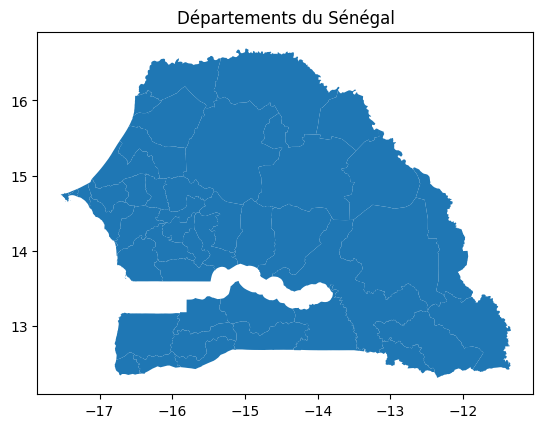

In [45]:
# Charger le shapefile
# Remarque: Actualiser les chemins d'accès

shapefile_path = r"C:\Users\ADIE\Documents\stage_ansd\data_gadm\gadm41_SEN_shp\gadm41_SEN_2.shx"
gdf = gpd.read_file(shapefile_path)

# Visualiser le shapefile
gdf.plot()
plt.title('Départements du Sénégal')
plt.show()


In [46]:
gdf.head()

,GID_2,GID_0,COUNTRY,GID_1,NAME_1,NL_NAME_1,NAME_2,VARNAME_2,NL_NAME_2,TYPE_2,ENGTYPE_2,CC_2,HASC_2,geometry
0,SEN.1.1_1,SEN,Senegal,SEN.1_1,Dakar,NA,Dakar,NA,NA,Département,Department,11,SN.DK.DK,"MULTIPOLYGON (((-17.46680 14.65014, -17.46680 ..."
1,SEN.1.2_1,SEN,Senegal,SEN.1_1,Dakar,NA,Guédiawaye,NA,NA,Département,Department,14,SN.DK.GD,"POLYGON ((-17.42902 14.76355, -17.42896 14.763..."
2,SEN.1.3_1,SEN,Senegal,SEN.1_1,Dakar,NA,Pikine,NA,NA,Département,Department,12,SN.DK.PK,"POLYGON ((-17.29675 14.75111, -17.29622 14.750..."
3,SEN.1.4_1,SEN,Senegal,SEN.1_1,Dakar,NA,Rufisque,Rufisque-Bargny,NA,Département,Department,13,SN.DK.RF,"POLYGON ((-17.25486 14.70375, -17.25486 14.704..."
4,SEN.2.1_1,SEN,Senegal,SEN.2_1,Diourbel,NA,Bambey,NA,NA,Département,Department,31,SN.DB.BB,"POLYGON ((-16.52628 14.60573, -16.52672 14.605..."


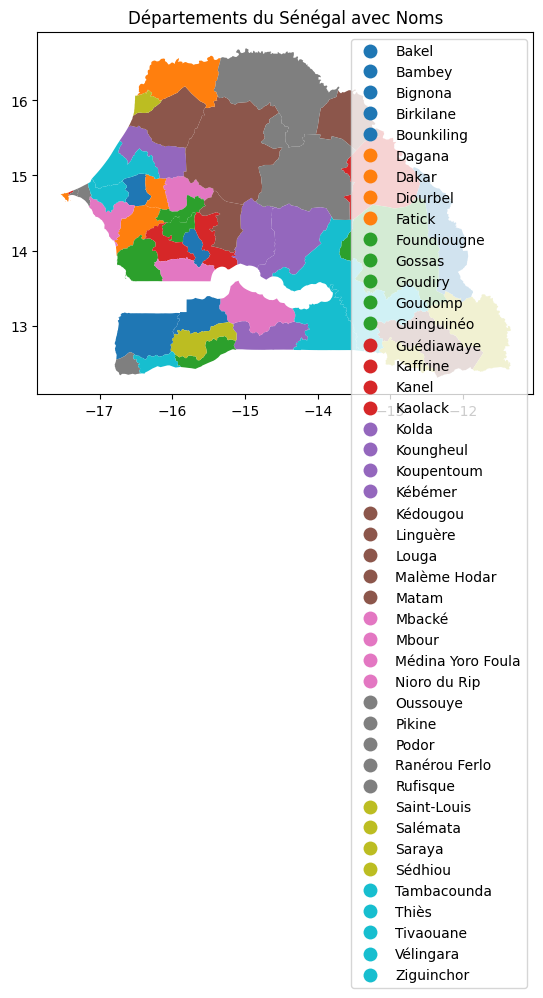

In [47]:

# Visualiser le shapefile avec les noms des départements
gdf.plot(column='NAME_2', legend=True)
# NAME_2 est la colonne contenant les noms de départements
plt.title('Départements du Sénégal avec Noms')
plt.show()


Exercice: Calculer les surfaces des départements

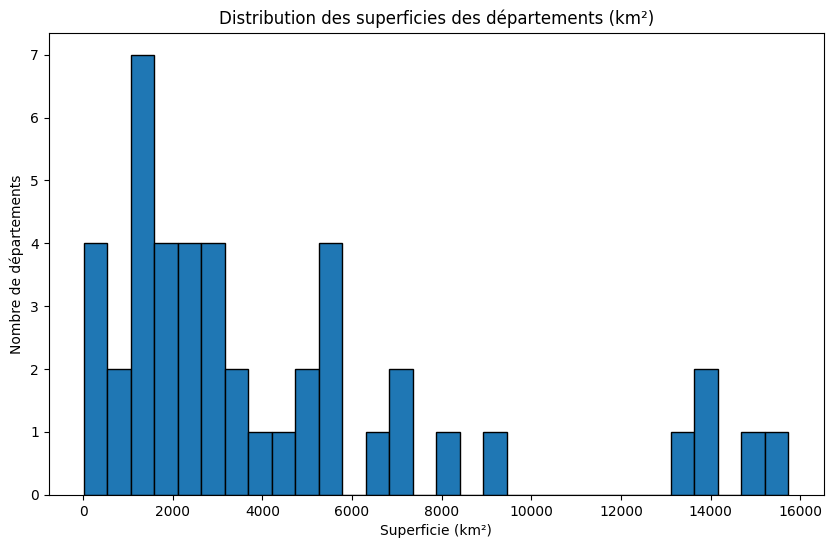

In [48]:
# Convertir en projection appropriée pour calculer les superficies (par exemple UTM Zone 28N)
gdf = gdf.to_crs(epsg=32628)

# Calculer la superficie en km², elle est en m² initialement
gdf['superficie_km2'] = gdf['geometry'].area / 10**6

# Visualiser la distribution des superficies
plt.figure(figsize=(10, 6))
gdf['superficie_km2'].plot(kind='hist', bins=30, edgecolor='black')
plt.title('Distribution des superficies des départements (km²)')
plt.xlabel('Superficie (km²)')
plt.ylabel('Nombre de départements')
plt.show()



In [49]:
# Identifier les départements les plus grands et les plus petits
max_superficie = gdf['superficie_km2'].idxmax()
min_superficie = gdf['superficie_km2'].idxmin()

print(f"Le département le plus grand est {gdf.loc[max_superficie, 'NAME_2']} avec {gdf.loc[max_superficie, 'superficie_km2']:.2f} km².")
print(f"Le département le plus petit est {gdf.loc[min_superficie, 'NAME_2']} avec {gdf.loc[min_superficie, 'superficie_km2']:.2f} km².")


Le département le plus grand est Goudiry avec 15732.80 km².
Le département le plus petit est Guédiawaye avec 18.78 km².


In [50]:
# Calculer la somme des superficies de tous les départements
somme_superficies = gdf['superficie_km2'].sum()
somme_superficies

196861.6862289578

On retrouve quasiment la superficie du Sénégal.

# Section 6: Démarche méthodologique
# ------------------------------------------------------



**A. Source de données satellites**

Pour extraire des données satellites, la première étape consiste à identifier les sources de données disponibles, comme Sentinel (Sentinel-1, Sentinel-2, ...) de l'Agence Spatiale Européenne (ESA) et Landsat de la NASA/USGS. Ces sources offrent des images multispectrales gratuites, idéales pour l'observation de la Terre. Ensuite, il est important de choisir une plateforme d'accès aux données, telle que Google Earth Engine (GEE), qui permet de traiter et d'analyser des images satellites à grande échelle. Le processus d'extraction commence par la définition des paramètres d'intérêt : la zone géographique (polygone), la période temporelle, et les indices à calculer si besoin (par exemple, NDVI pour la végétation). Avec des plateformes telles que GEE, on peut programmer des requêtes pour télécharger les images filtrées selon ces critères.



Une fois les données brutes récupérées, elles sont traitées pour corriger les distorsions géométriques et atmosphériques, souvent en utilisant des scripts Python ou R. Il est recommandé de filtrer les images en fonction de la couverture nuageuse pour obtenir des résultats plus précis. Des indices tels que NDVI (Normalized Difference Vegetation Index) ou NDWI (Normalized Difference Water Index) peuvent être calculés pour surveiller l'état de la végétation ou de l'eau, en appliquant des formules sur les bandes spectrales désignées. Les résultats sont ensuite analysés pour identifier des tendances ou des changements dans le temps, offrant des informations précieuses pour la gestion des terres agricoles ou d'autres applications scientifiques et opérationnelles.

**B. Traitement des données satellites**

**1. Collecte et Préparation des Données**


La première étape consiste à rassembler les données géographiques des parcelles agricoles, comprenant les coordonnées GPS (latitude et longitude), le type de culture, et la superficie de chaque parcelle. Ces données sont cruciales car elles permettront de localiser précisément chaque parcelle sur les images satellitaires. Les données sont ensuite nettoyées pour éliminer les valeurs manquantes et les incohérences, puis converties en formats compatibles pour les analyses géospatiales (comme GeoDataFrames).

**2. Accès aux Données Satellitaires**


Une fois les parcelles géoréférencées, l'étape suivante consiste à accéder aux données satellites adaptées, comme celles fournies par Sentinel-2 ou Landsat 8. Ces satellites offrent des images multispectrales avec des bandes spécifiques utilisées pour calculer des indices tels que le NDVI (Normalized Difference Vegetation Index), qui est un indicateur clé de la végétation. L'accès aux données peut se faire via des plateformes comme Google Earth Engine (GEE), qui permet de manipuler et d'extraire ces données facilement à l'aide de scripts Python.

**3. Extraction des Indices de Végétation**


Pour chaque parcelle, les coordonnées GPS sont utilisées pour extraire les valeurs d'indices de végétation, comme le NDVI, à partir des images satellitaires. Cette extraction est réalisée sur des périodes précises correspondant aux cycles culturaux des parcelles. L'index NDVI, par exemple, est calculé à partir des bandes infrarouge proche (B8) et rouge (B4) des images Sentinel-2. Ces valeurs d'indices sont ensuite stockées pour chaque parcelle, fournissant une mesure indirecte de la santé et de la densité de la végétation.

**4. Analyse des Surfaces Agricoles**


Avec les indices de végétation extraits, l'étape suivante est d'estimer la surface cultivée pour chaque parcelle. En analysant les valeurs de NDVI, il est possible de déterminer la couverture végétale et d'évaluer l'extension des cultures. Cette analyse permet non seulement de valider les données de superficie initialement fournies, mais aussi d'identifier des anomalies ou des incohérences éventuelles, comme des parcelles mal répertoriées ou des changements dans l'utilisation des terres.

**Comment faire cette analyse ?**

**a. Réseau de neurones**

Ils sont puissants pour déterminer et modéliser des relations complexes entre les variables d'entrée et celles de sortie. 

Architecture du Réseau de Neurones :

L'architecture du réseau pourrait inclure plusieurs couches cachées avec des neurones entièrement connectés (couches fully connected), permettant au modèle d'apprendre des représentations abstraites des données. Par exemple :


Entrées : Indices de végétation agrégés (NDVI moyen, maximum, etc.), type de culture et autres caractéristiques pertinentes.


Couches cachées : Plusieurs couches avec des fonctions d'activation non linéaires (ReLU, par exemple).


Sortie : Une couche de sortie avec une seule unité neurone pour prédire la superficie cultivée.

Entraînement du Modèle :

Le modèle serait entraîné sur un ensemble de données comprenant des parcelles pour lesquelles la superficie cultivée est déjà connue (données de terrain ou données rapportées). L'objectif serait de minimiser l'erreur entre les prédictions du modèle et les valeurs réelles de superficie.
Des techniques comme le dropout peuvent être utilisées pour éviter le surapprentissage, surtout si le modèle est complexe.

Validation et Optimisation :

Une fois le modèle entraîné, il est crucial de le valider sur le jeu de données test pour s'assurer qu'il généralise bien. Il s'agit optimiser les hyperparamètres du réseau (nombre de couches, nombre de neurones par couche, taux d'apprentissage, etc.).
Des métriques telles que la Mean Absolute Error (MAE), la Mean Squared Error (MSE), et le coefficient de détermination R² peuvent être utilisées pour évaluer la performance du modèle.

**b. Autres approches**

Il peut être intéressant de tester d'autres approches afin de comparer les résultats obtenus avec ceux produits par le deep learning. 

NB: De ma petite expérience personnelle, j'ai eu de biens meilleurs résultats avec les réseaux de neurones qu'avec les approches traditionnelles

* Les Gradient Boosting Machines

Les GBM combinent plusieurs arbres de décision faibles pour créer un modèle capable de gérer les interactions non linéaires entres les données. XGBoost, en particulier, est reconnu pour sa robustesse et sa capacité à éviter le surapprentissage. Il existe aussi CatBoost qui produit des arbres symétriques pour l'apprentissage.

* Les RandomForest

Les Random Forests sont des ensembles d'arbres de décision qui réduisent le risque de surapprentissage tout en offrant des prédictions robustes.

* Les Support Vector Machine

Les SVM sont puissants pour les classifications et les régressions dans des espaces de caractéristiques complexes, surtout avec l'utilisation de noyaux (kernels) non linéaires. Par contre, ils sont en général moins efficaces que les méthodes Boosting pour de larges ensembles de données

**5. Intégration et Visualisation des Résultats**


Les résultats des analyses sont intégrés dans un système d'information géographique (SIG) ou dans un outil de visualisation comme Folium, ce qui permet de cartographier les parcelles avec les indices calculés. Ces visualisations aident à mieux comprendre la répartition spatiale des cultures et les dynamiques agricoles. Elles permettent également de produire des rapports détaillés sur l'état des surfaces agricoles, facilitant ainsi la prise de décision pour des actions ciblées, telles que l'optimisation des rendements ou la gestion des ressources.

**6. Interprétation et Validation**


La dernière étape de la démarche méthodologique consiste à interpréter les résultats obtenus et à les valider. L'estimation des surfaces agricoles à partir des données satellitaires est comparée aux données de terrain (si disponibles) pour s'assurer de la précision des analyses. Ce processus de validation est essentiel pour confirmer que les données satellitaires reflètent fidèlement les réalités agricoles et pour ajuster les modèles d'analyse si nécessaire.